In [3]:
#!pip install timesynth
# TIMESYNTH TO GENERATE TIME SERIESES
import ts_syntheticData
from ts_syntheticData import insert_anomalies
# CUSTOM DEFINED DATALOADERS AND MODELS
from ts_dataloader import get_datasets, load_data
from ts_training import train_network
from ts_VI_LSTM import Variational_LSTM, loss_normal2d, loss_normal2d_lognormal
from ts_simple_LSTM_net import Standard_LSTM, loss_function_normal
from ts_anomaly_function import detect_anomalies, detect_anomalies_VAE
# PYTORCH
import torch
from torch import optim, distributions
from torch.utils.data import DataLoader
from torch.optim.lr_scheduler import StepLR
# MATPLOTLIB NUMPY ETC.
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="darkgrid")
import numpy as np
import math

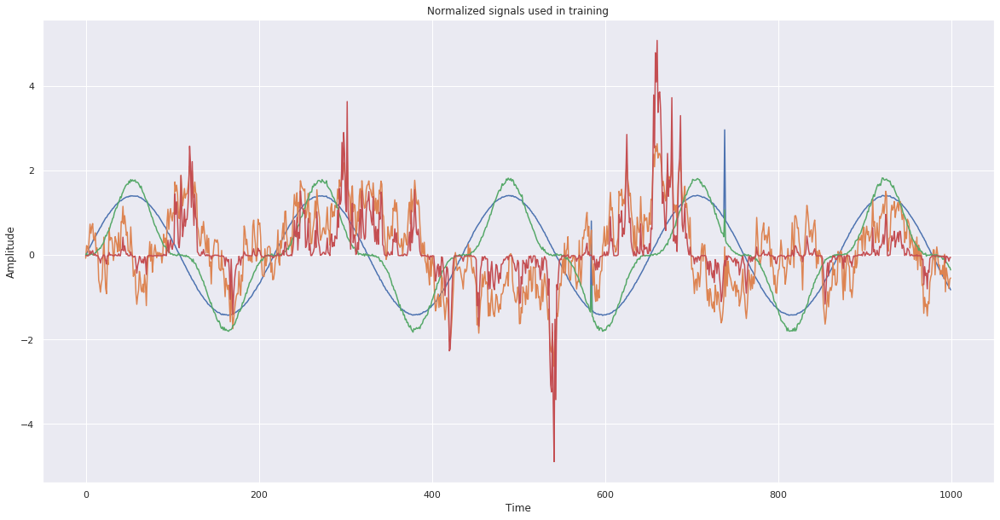

In [11]:
#USEDATASET = 0  # simple synthetic dataset
USEDATASET = 1 # correlated synthetic dataset
#USEDATASET = 2 # realistic weather dataset

# anomaly parameters
add_anomalies = False
if (USEDATASET == 0) or (USEDATASET == 1):
    add_anomalies = True
# anomaly probability
anomalies_p = 0.001
# anomaly magnitude
anomalies_m = 3


# set device
use_cuda = torch.cuda.is_available()
device = torch.device('cuda:0' if use_cuda else 'cpu')

# number of samples in the time series
train_T = 1000
valid_T = 1000
test_T = 1000
# width of the window of each time series
W = 1000
# check for inconsistency
if W > train_T:
    raise ValueError("The time window cannot be longer than the training data sequence available.")

T = train_T + valid_T + test_T
# the size of train and validation, test is the remainder of the data
t_v_t_split = [train_T/T,valid_T/T]

#load the data in, this is supposed to happen only once
raw_signals = load_data(USEDATASET, T)

if add_anomalies:
    timeseries_signals, timeseries_labels = insert_anomalies(raw_signals, magnitude=anomalies_m, p=anomalies_p)
else:
    timeseries_signals = raw_signals
    timeseries_labels = None

features, train_dataset, valid_dataset, test_dataset = get_datasets(USEDATASET, t_v_t_split, W, device, timeseries_signals, timeseries_labels)

train_timeseries_signals = train_dataset.get_data()[0]
plt.figure(figsize = (20,10))
plt.title("Normalized signals used in training")
plt.plot(list(range(len(train_timeseries_signals))), train_timeseries_signals)
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.show()

In [13]:
# Here we can change to batch size
# batch size (number of serieses of length W)
B = 1
# check for consistency, we don't want to pad the sequence if possible
if (train_T - W + 1) % B != 0 :
    raise ValueError("The batch size chosen will result in different sized batches during training")

# create the Synthetic Dataset
train_loader = DataLoader(train_dataset, batch_size=B, shuffle=False)

# VI approach

In [ ]:
import torch
from torch import nn, distributions


class Variational_LSTM(nn.Module):
    def __init__(self, input_dim, param_dist, hidden_dim_rec, hidden_dim_gen, latent_dim):
        super(Variational_LSTM, self).__init__()

        # parameters
        self.latent_dim = latent_dim
        self.input_dim = input_dim
        self.hidden_dim_rec = hidden_dim_rec
        self.hidden_dim_gen = hidden_dim_gen

        # activation and dropouts
        self.relu = nn.ReLU()
        self.dropout1 = nn.Dropout(p=0.2)
        self.dropout2 = nn.Dropout(p=0.2)

        # encoder net, recognition model q(z_t+1|x_1:t)
        self.encoder_LSTM = nn.LSTM(input_size=input_dim,
                                    hidden_size=hidden_dim_rec,  # 2 because we want mu and sigma
                                    num_layers=1
                                    )
        self.encoder_hidden2hidden = nn.Linear(hidden_dim_rec, hidden_dim_rec)

        self.enc2latent = nn.Linear(hidden_dim_rec, 2 * latent_dim)

        # decoder net p(x_t+1|x_1:t,z_1:t)
        self.decoder_LSTM = nn.LSTM(input_size=input_dim + latent_dim,
                                    hidden_size=hidden_dim_gen,
                                    num_layers=1
                                    )

        self.decoder_hidden2hidden = nn.Linear(hidden_dim_gen, hidden_dim_gen)

        self.dec2features = nn.Linear(hidden_dim_gen, param_dist * input_dim)

        self.decoder = nn.Sequential(
            self.decoder_LSTM,
            self.decoder_hidden2hidden,
            nn.ReLU(),
            self.dec2features
        )

    def forward(self, x, device):
        outputs = {}
        outputs["x_input"] = x
        batch_size = x.shape[0]
        seq_length = x.shape[1]
        # --- recognition LSTM to generate latent variable(s) for each time step --- #

        # get x in the right format: [seq_length, batch_size, input_dimension]
        x_encoder = x.permute(1, 0, 2)
        encoder_out, (h, c) = self.encoder_LSTM(x_encoder)
        x_latent = self.enc2latent(self.dropout1(encoder_out))  # outputs the latent variable parameters mu and sigma

        # make the network learn the log of the variance it is non-negative (log only takes pos x)
        mu, log_var = torch.chunk(x_latent, 2, dim=-1)
        sigma = torch.exp(log_var / 2)  # std of the latent variable distribution
        
        
        # --- reparameterization trick happens here --- #
        epsilon = 0
        with torch.no_grad():
            epsilon = torch.randn(seq_length,
                                  batch_size,
                                  self.latent_dim,
                                  ).to(device)
        # create the random latent variable, reparametrization trick
        z = mu + sigma * epsilon

        # store intermediate results and latent variables
        outputs["z"] = z
        outputs["z_mu"] = mu
        outputs["z_sigma"] = sigma
        outputs["z_log_var"] = log_var

        
        # --- ordinary LSTM to predict the next x in the time sequence --- #
        # concatenate the latent variables with the original input x
        x_aug = torch.cat((x_encoder, z), dim=-1)  # aug = augmented x, because we augment x with z

        # run it through the ordinary LSTM
        decoder_out, (h, c) = self.decoder_LSTM(x_aug)
        # symmetry with encoder
        params = self.dec2features(self.dropout2(decoder_out))

        # store the outputs in the form (batch_size, seq_length, input_dim)
        outputs["params"] = params

        return outputs


def loss_normal2d(model_output, device, beta):
    # unpack the required quantities
    x_true = model_output["x_input"].permute(1, 0, 2)
    params = model_output["params"]
    mu, logvar = torch.chunk(params, 2, dim=-1)
    sigma = torch.exp(logvar / 2)

    z_mu = model_output["z_mu"]
    z_log_var = model_output["z_log_var"]

    seq_length = mu.shape[0]
    # iterate over each time step in the sequence to compute NLL and KL terms

    t = 0
    # define the distribution
    p = distributions.Normal(mu[t, :, :], sigma[t, :, :])
    log_prob = torch.sum(p.log_prob(x_true[t + 1, :, :]), dim=-1)
    # dimensions [batch_size, dimension]
    ones_vector = torch.ones((z_mu.shape[1], z_mu.shape[2])).to(device)
    # KL-divergence
    negative_kl = 0.5 * torch.sum(ones_vector + z_log_var[t, :, :] - z_mu[t, :, :] ** 2 - torch.exp(z_log_var[t, :, :]),
                                  dim=-1)
    # KL divergence through time
    kl_tt = -negative_kl
    
    for t in range(1, seq_length - 1):
        # define the distribution
        p = distributions.Normal(mu[t, :, :], sigma[t, :, :])

        log_prob += torch.sum(p.log_prob(x_true[t + 1, :, :]), dim=-1)
        
        # KL-divergence
        negative_kl += 0.5 * torch.sum(ones_vector + z_log_var[t, :, :] - z_mu[t, :, :] ** 2 -
                                       torch.exp(z_log_var[t, :, :]), dim=-1)

        # KL divergence through time
        kl_tt -= negative_kl

    # average over the batches and divide by the sequence len-1 to get size independent from the length of the sequence
    NLL, KL = -torch.mean(log_prob, dim=0) / (seq_length - 1), torch.mean(kl_tt, dim=0) / (seq_length - 1)

    # define the ELBO
    ELBO = NLL + beta * KL

    return {
        "loss": ELBO,
        "ELBO": ELBO,
        "NLL": NLL,
        "KL": KL
    }

Training has started.
Epoch: 0


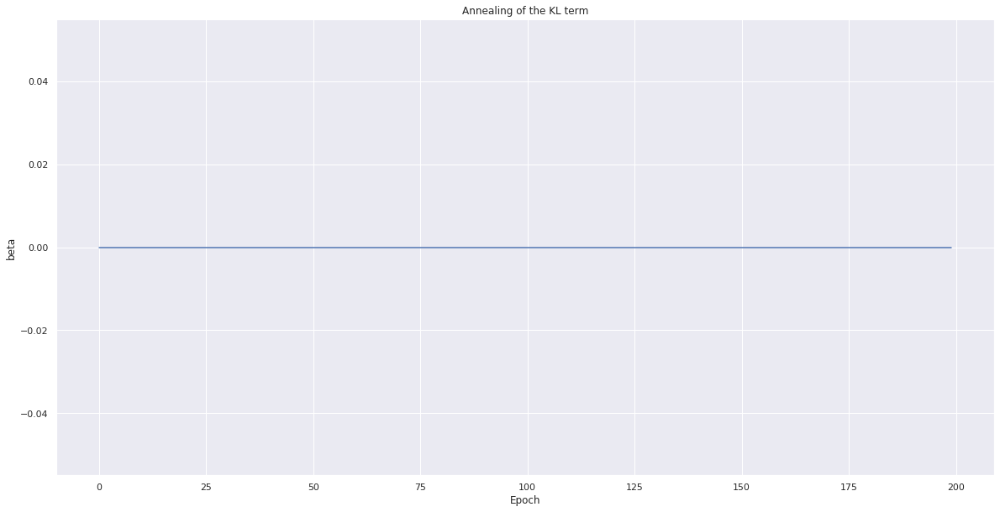

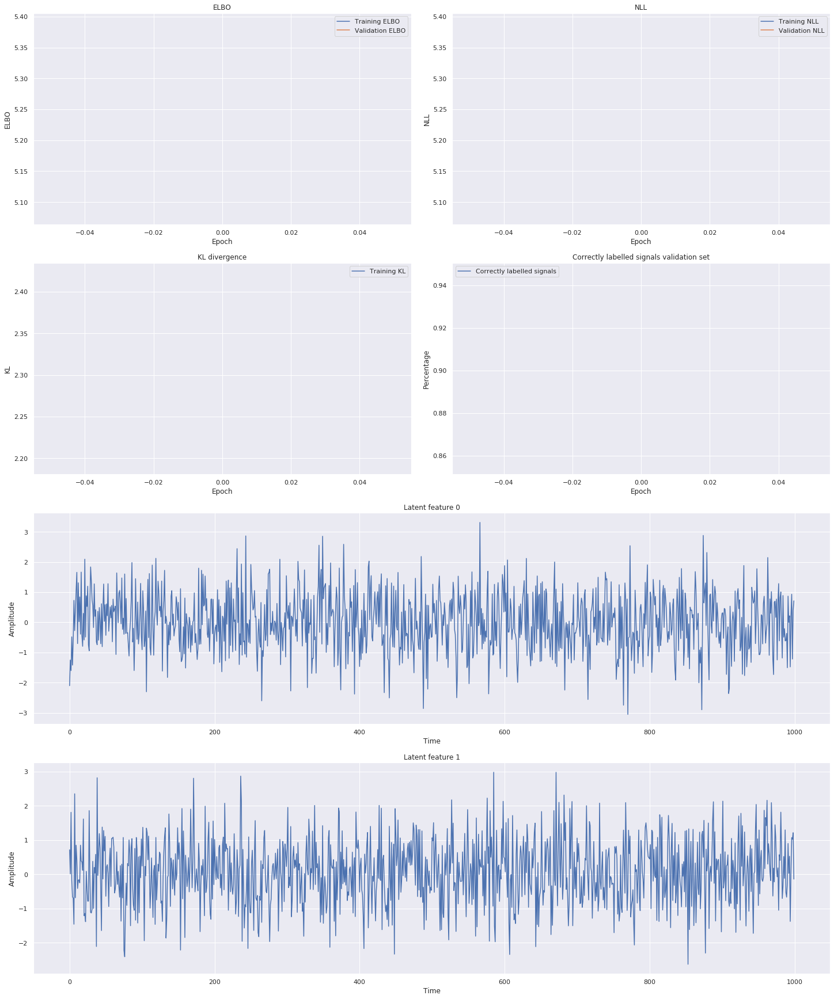

Epoch: 9


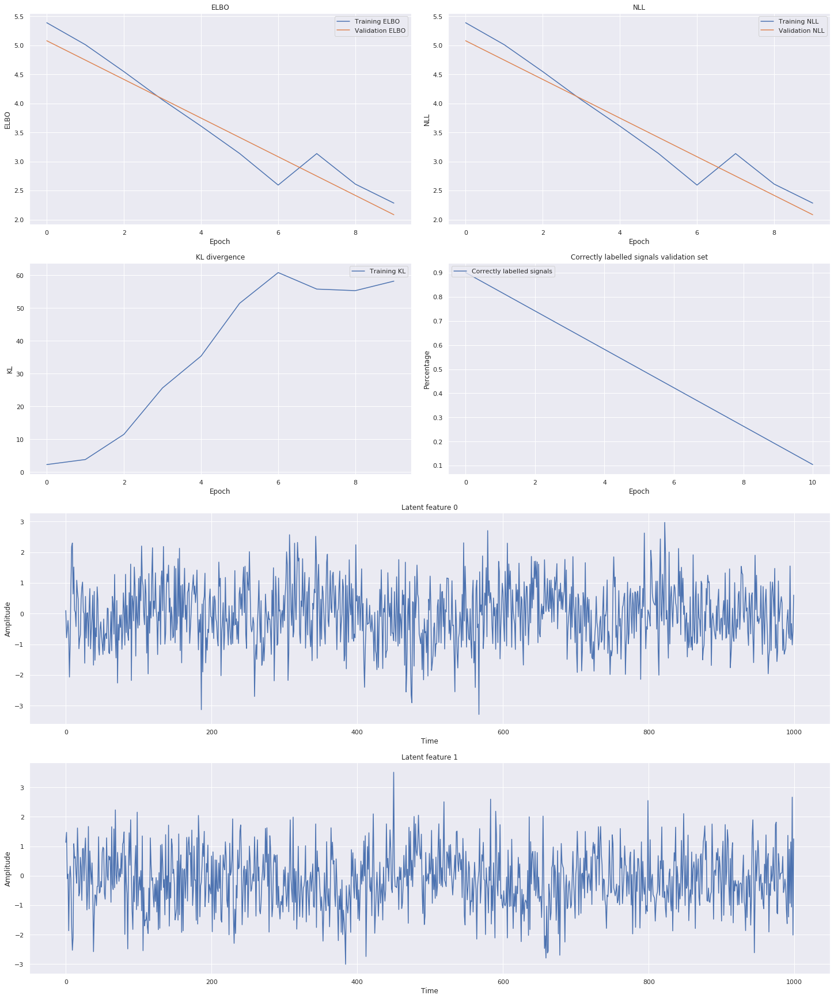

Epoch: 19


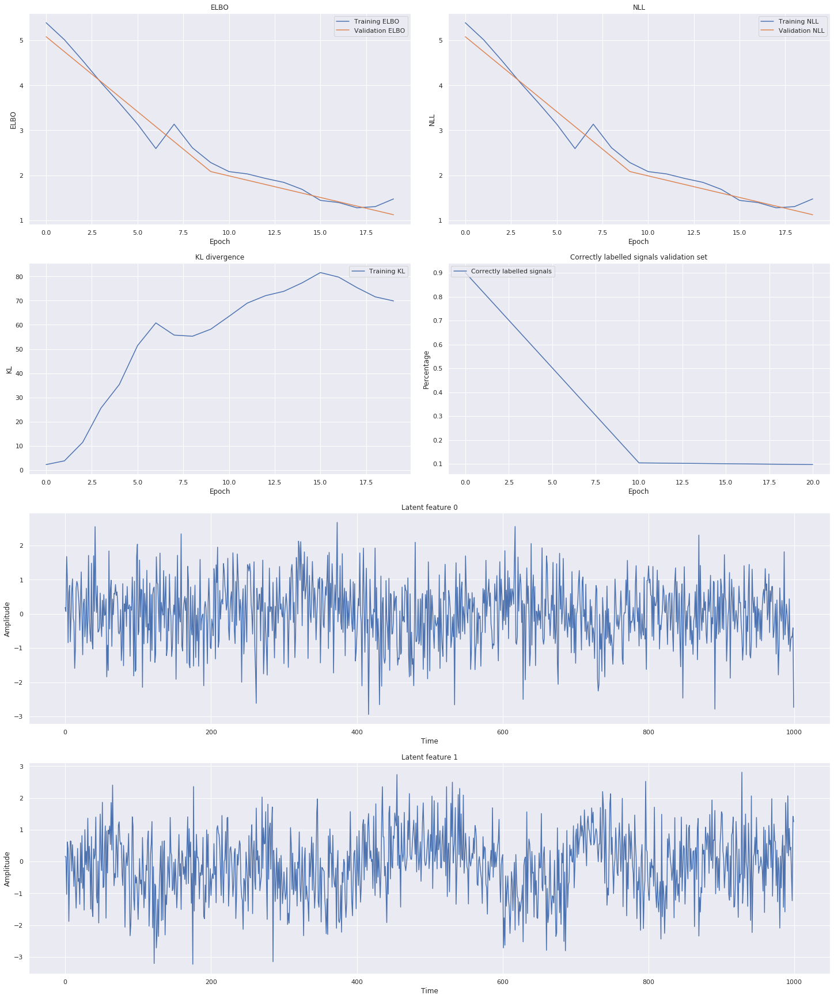

Epoch: 29


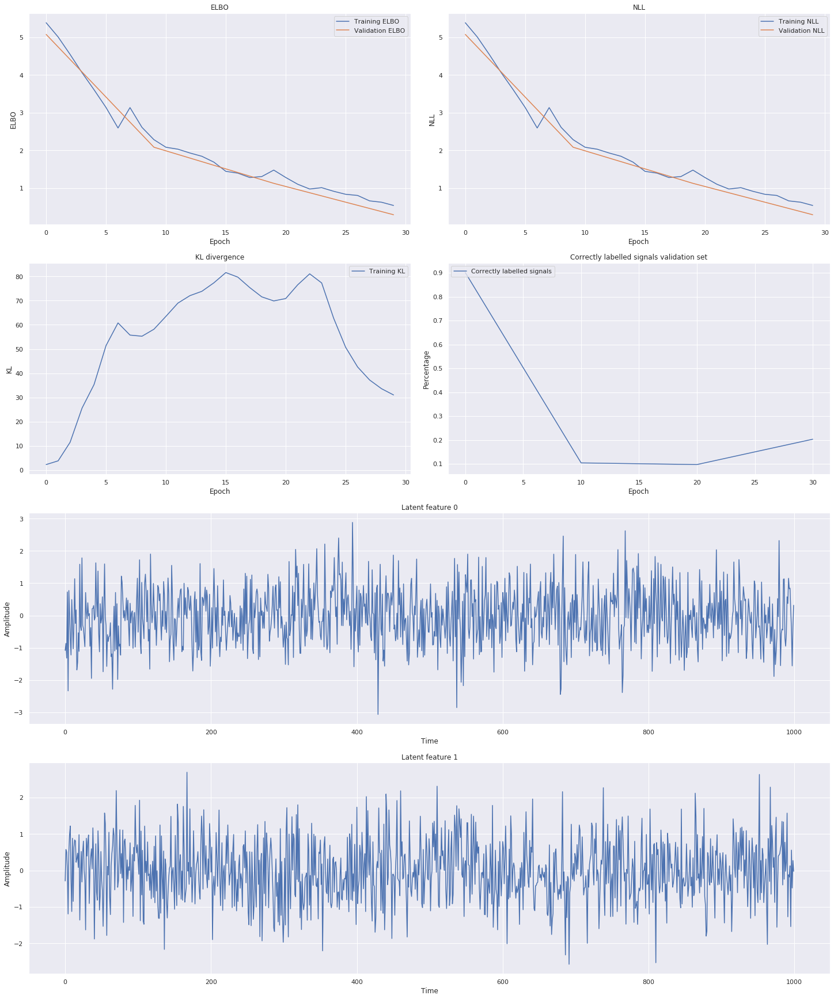

Epoch: 39


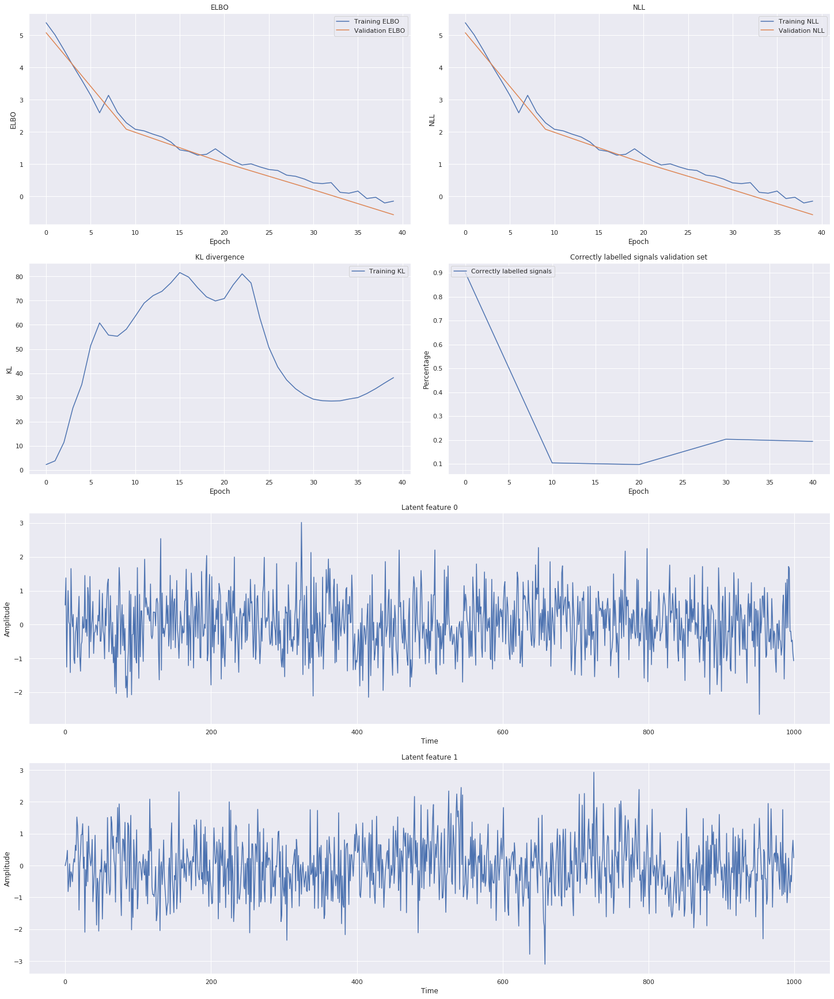

Epoch: 49


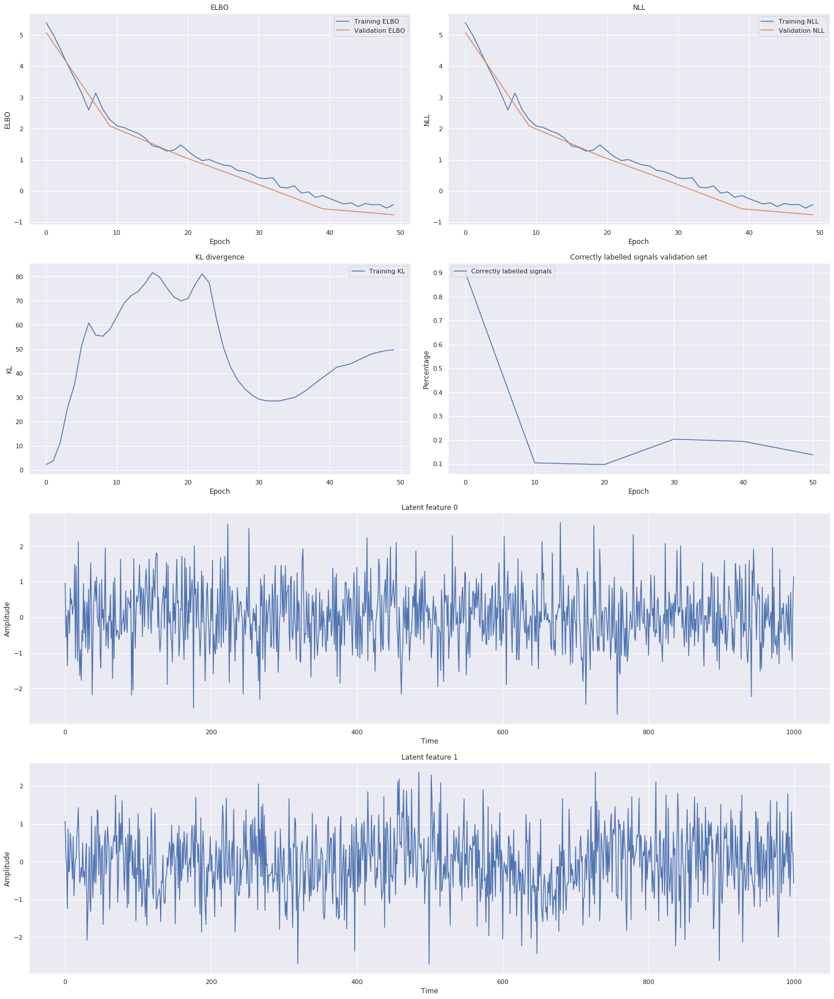

Epoch: 59


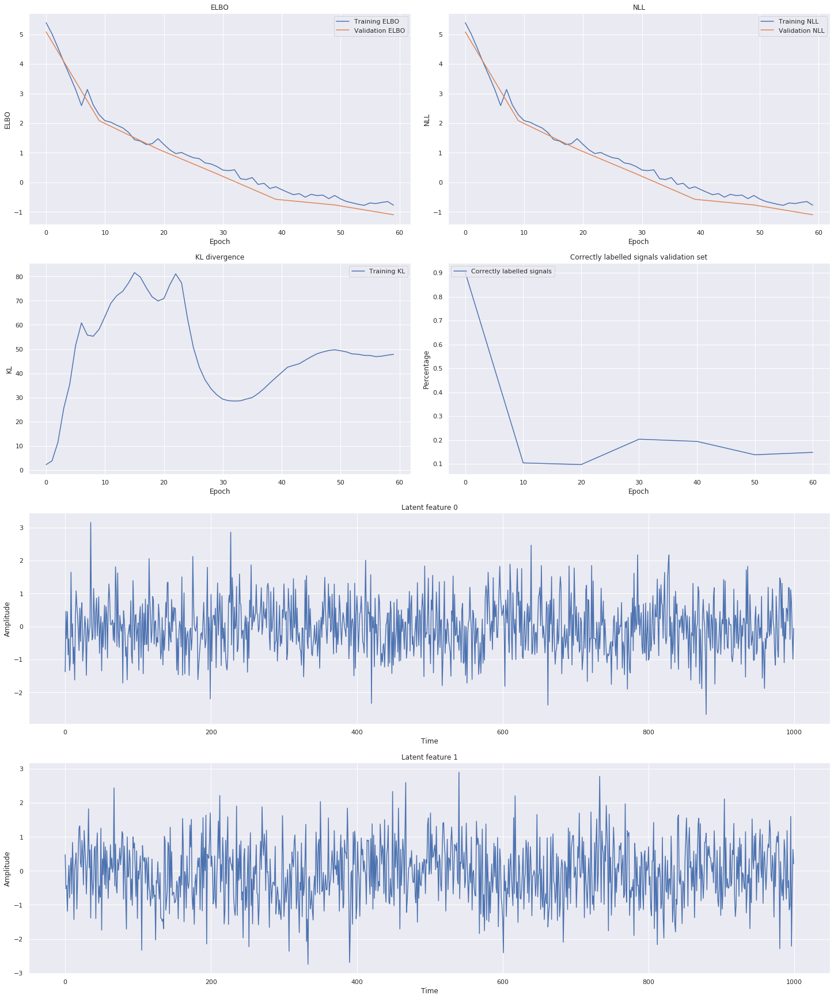

Epoch: 69


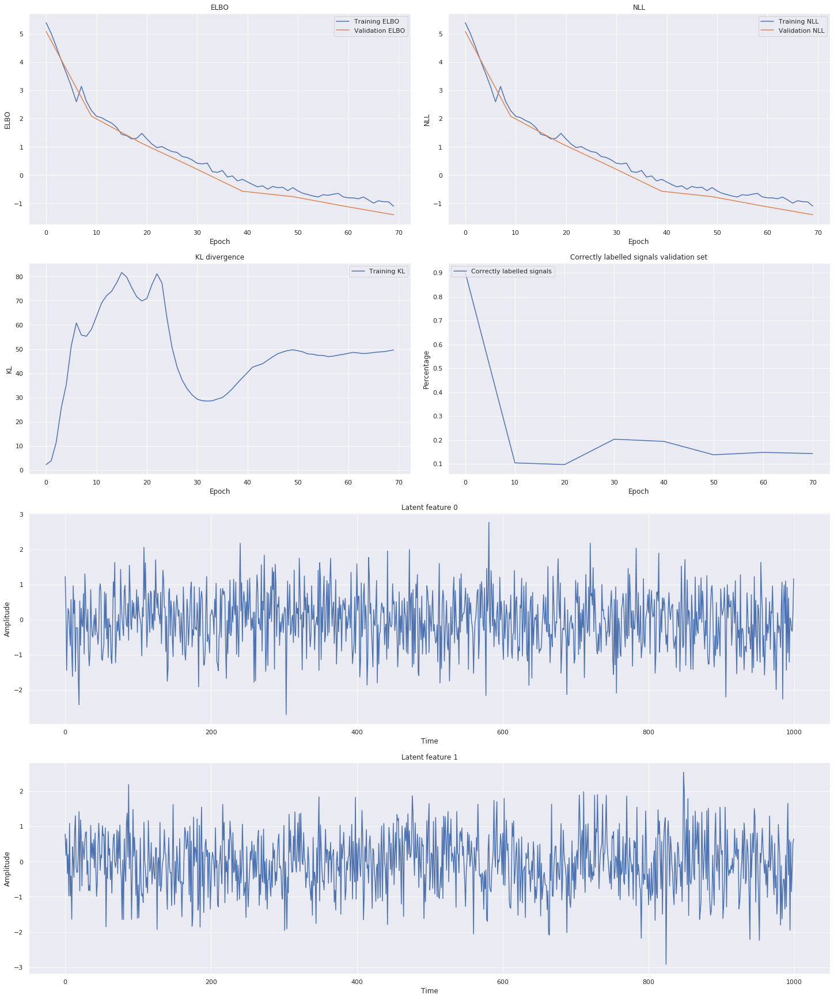

Epoch: 79


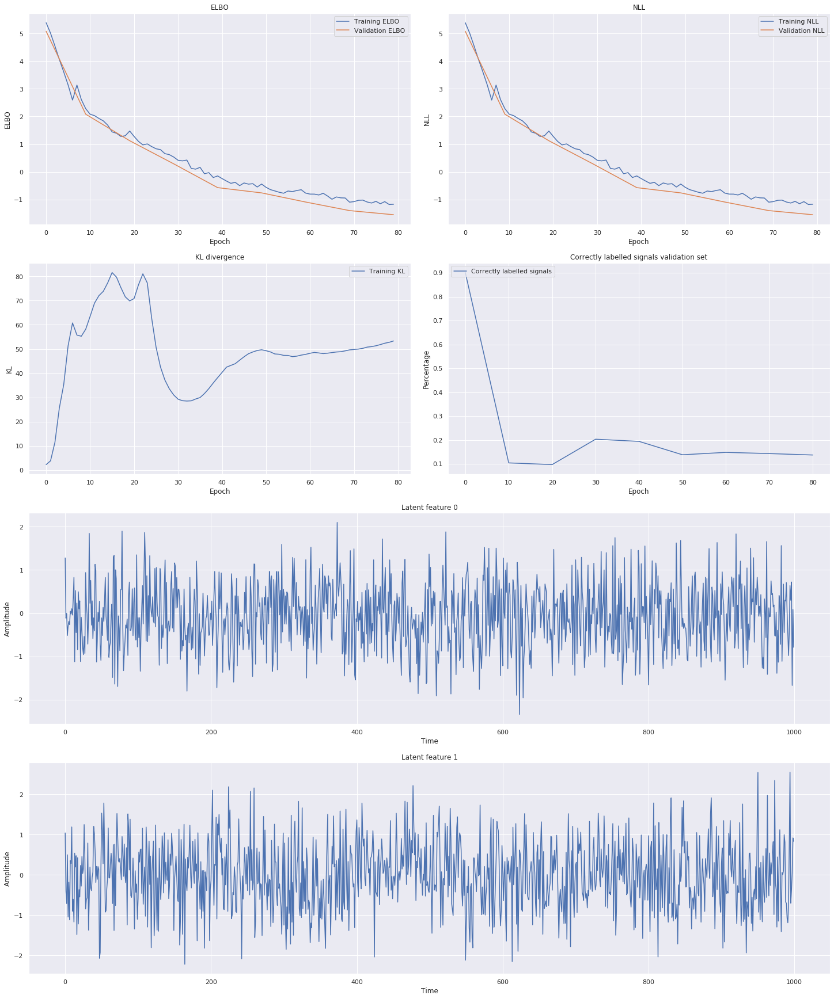

Epoch: 89


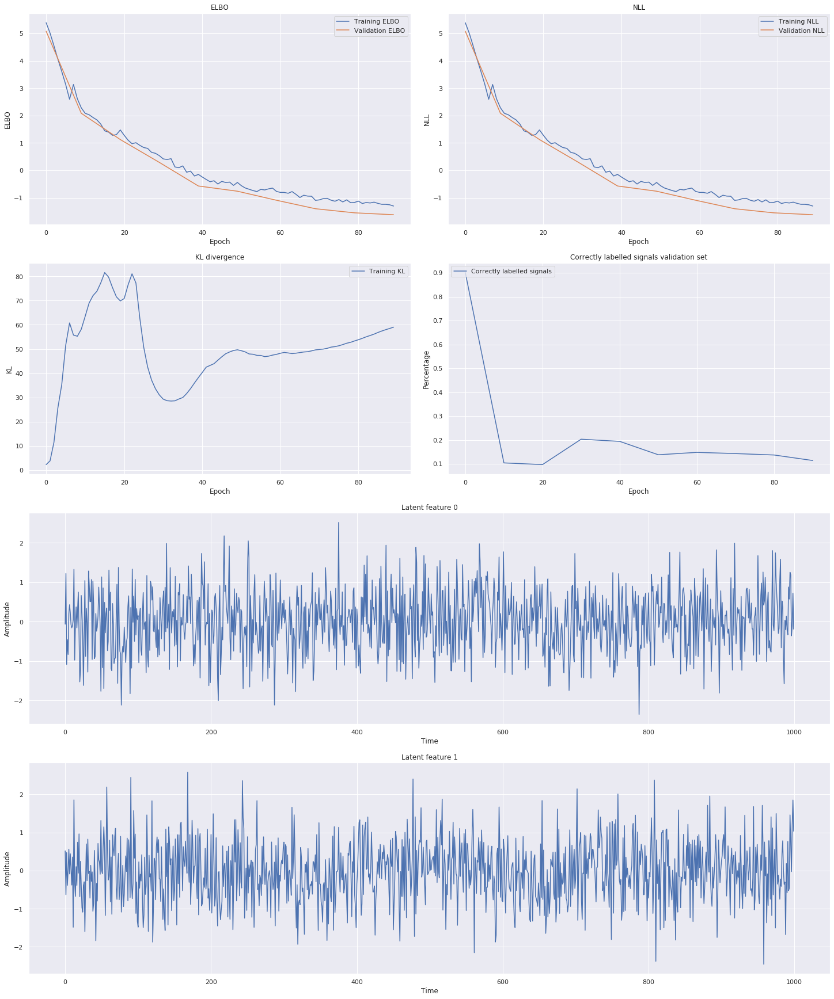

Epoch: 99


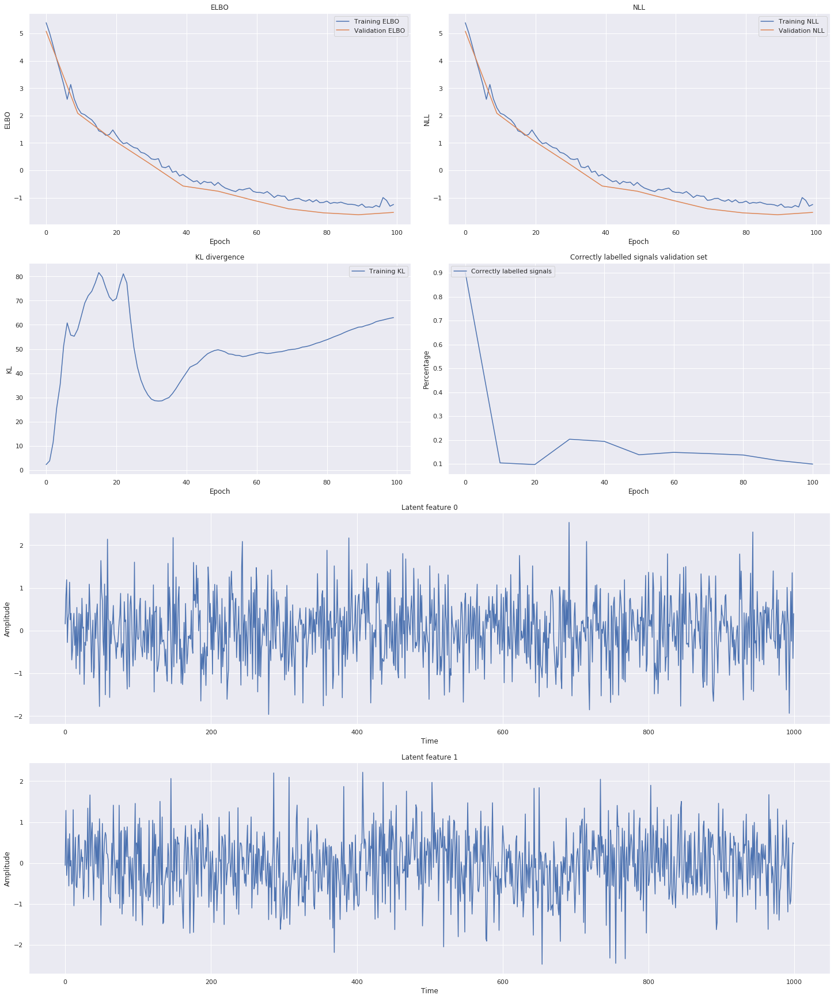

Epoch: 109


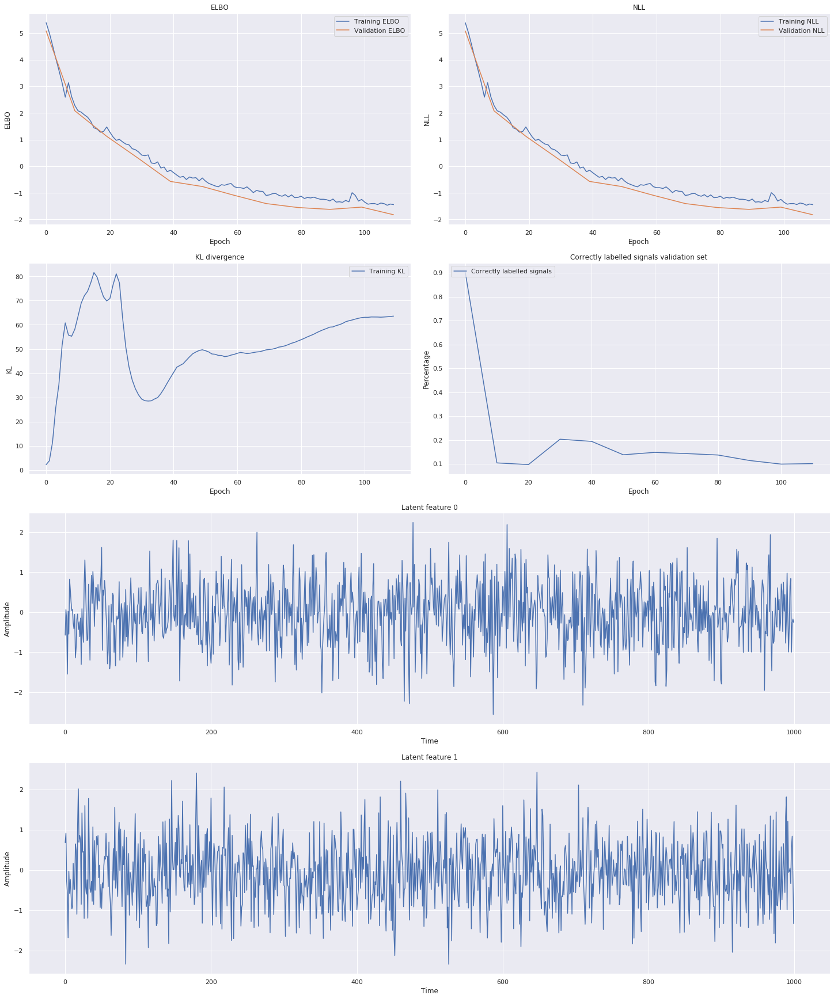

Epoch: 119


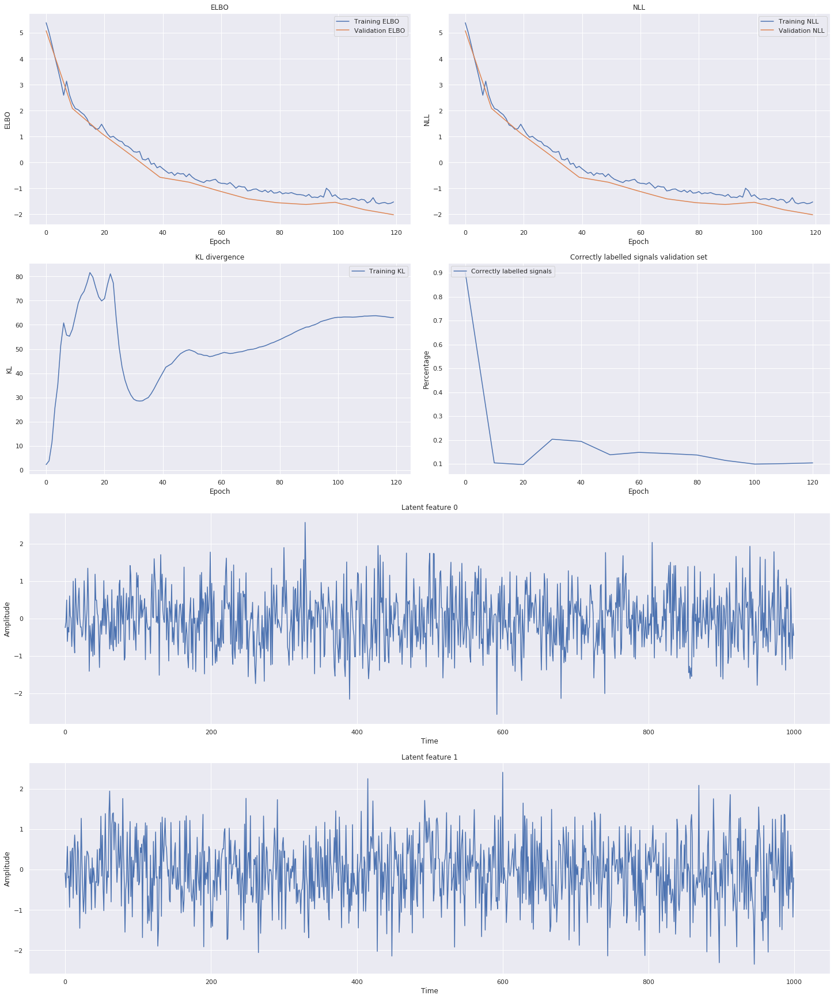

Epoch: 129


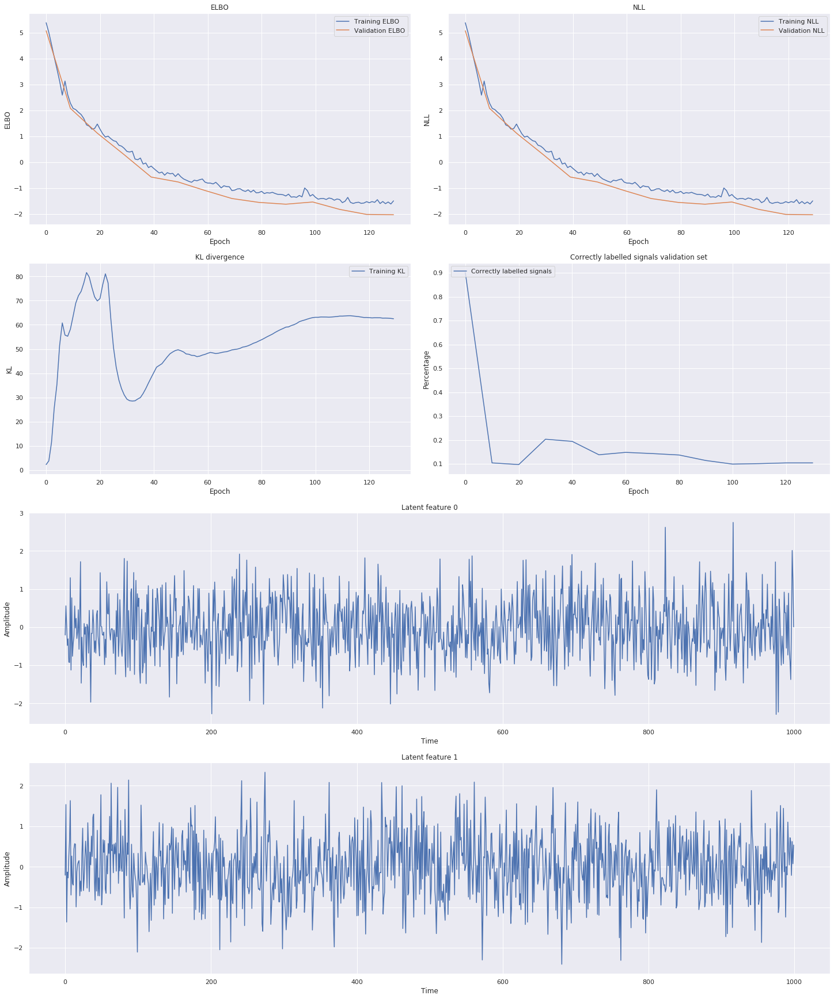

Epoch: 139


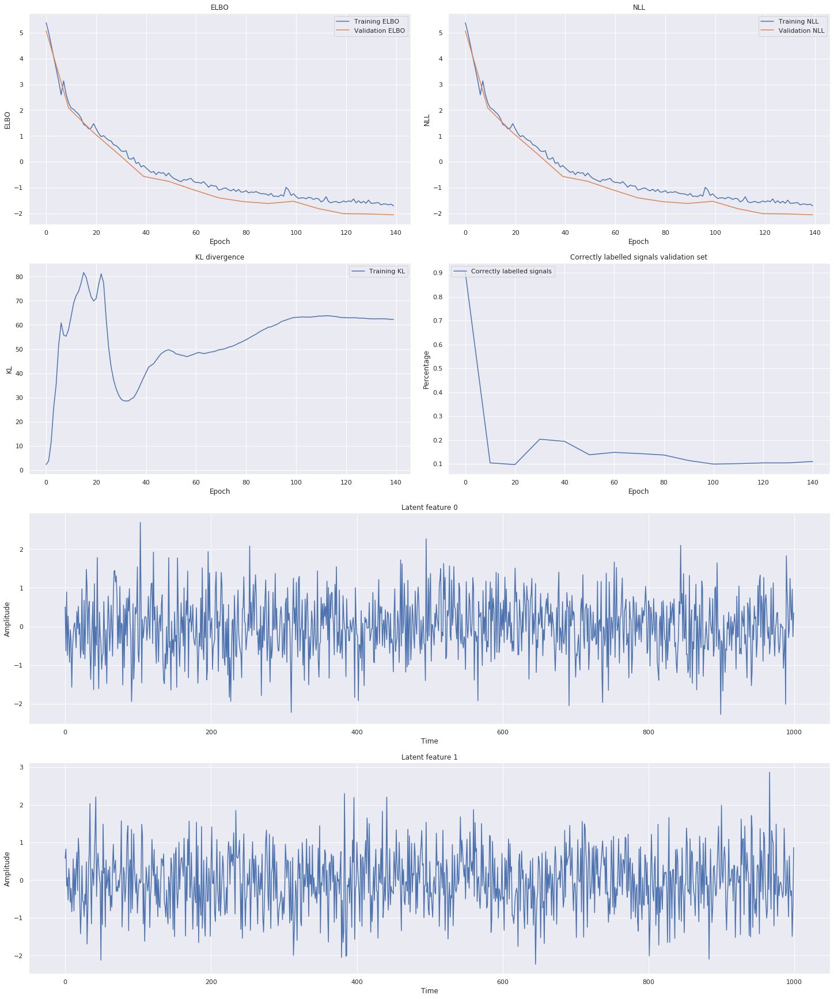

Epoch: 149


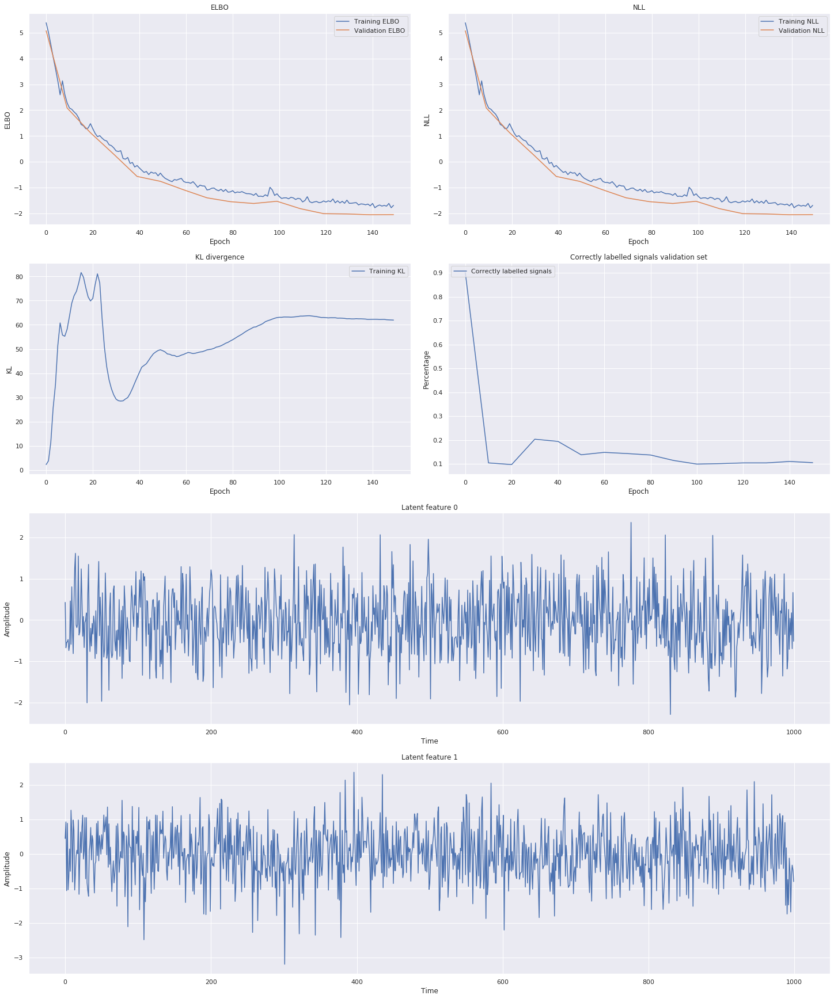

Epoch: 159


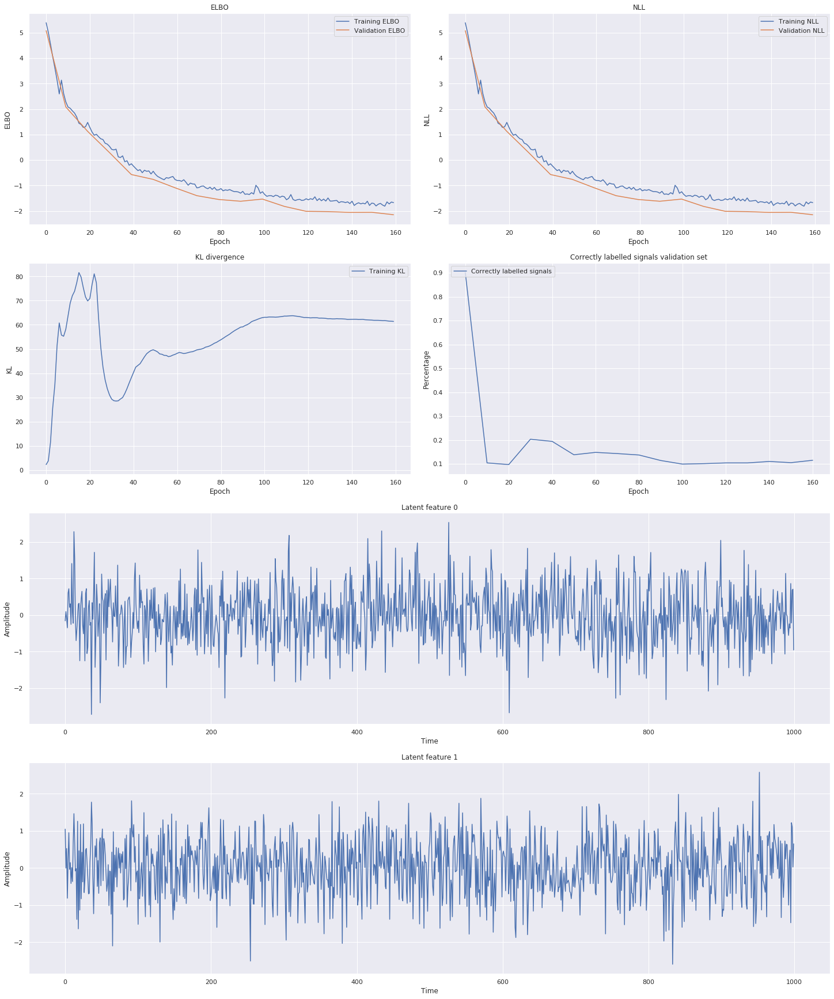

Epoch: 169


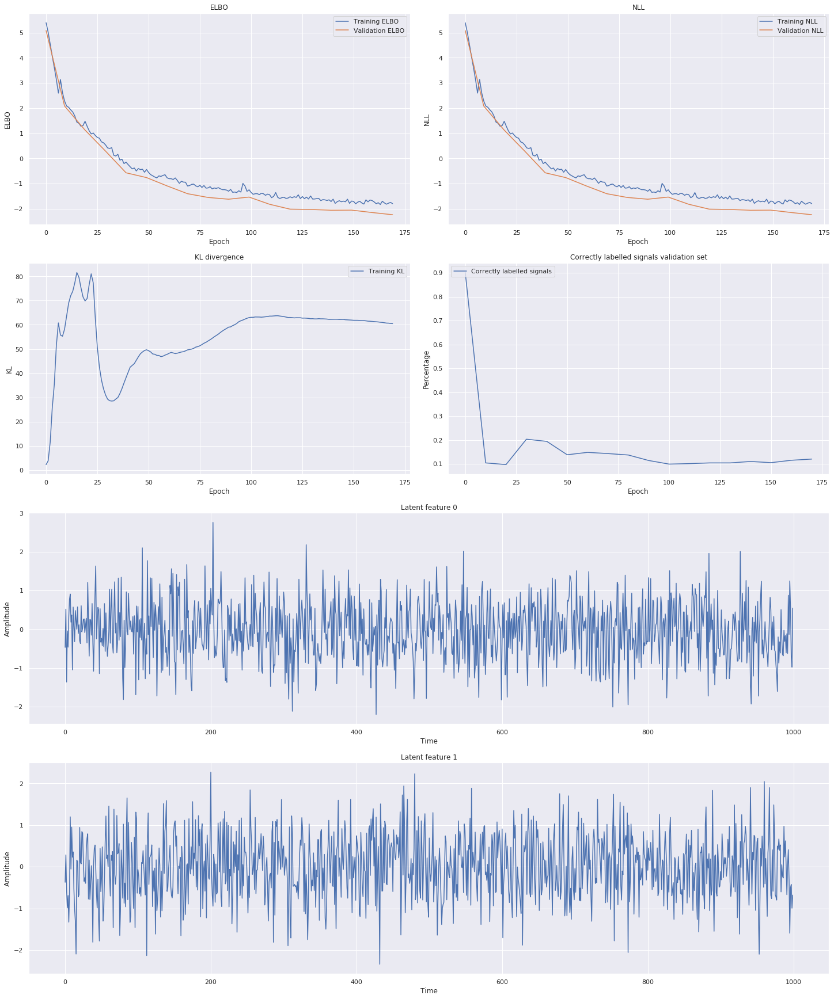

Epoch: 179


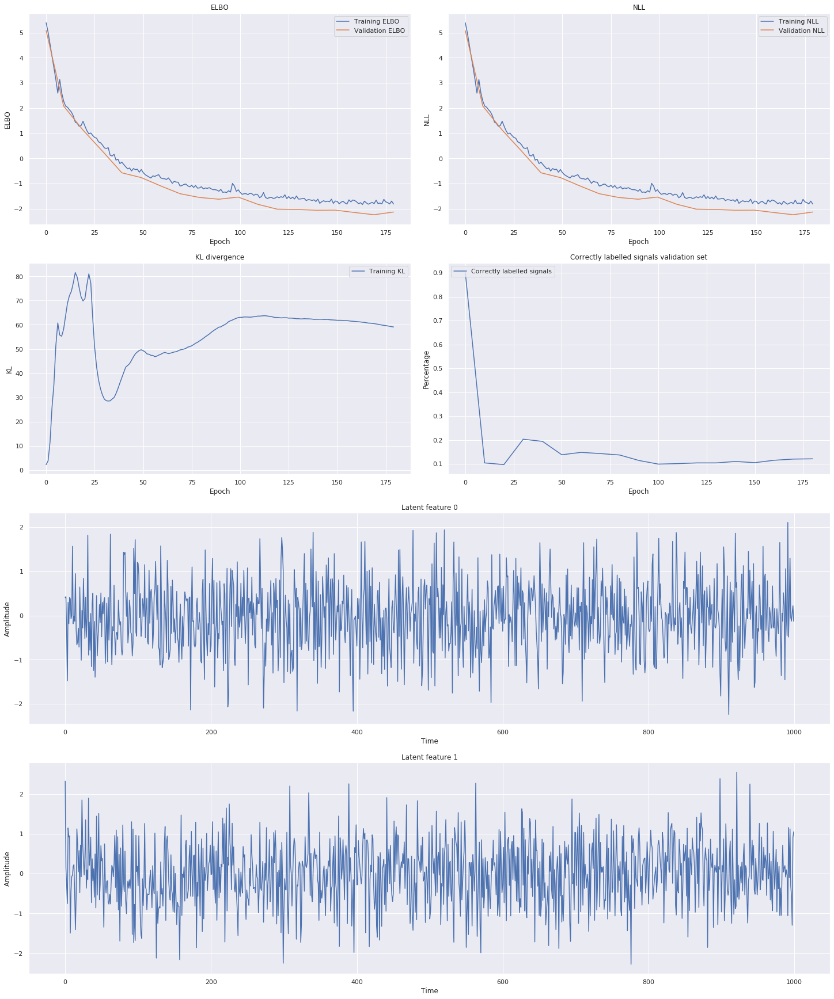

Epoch: 189


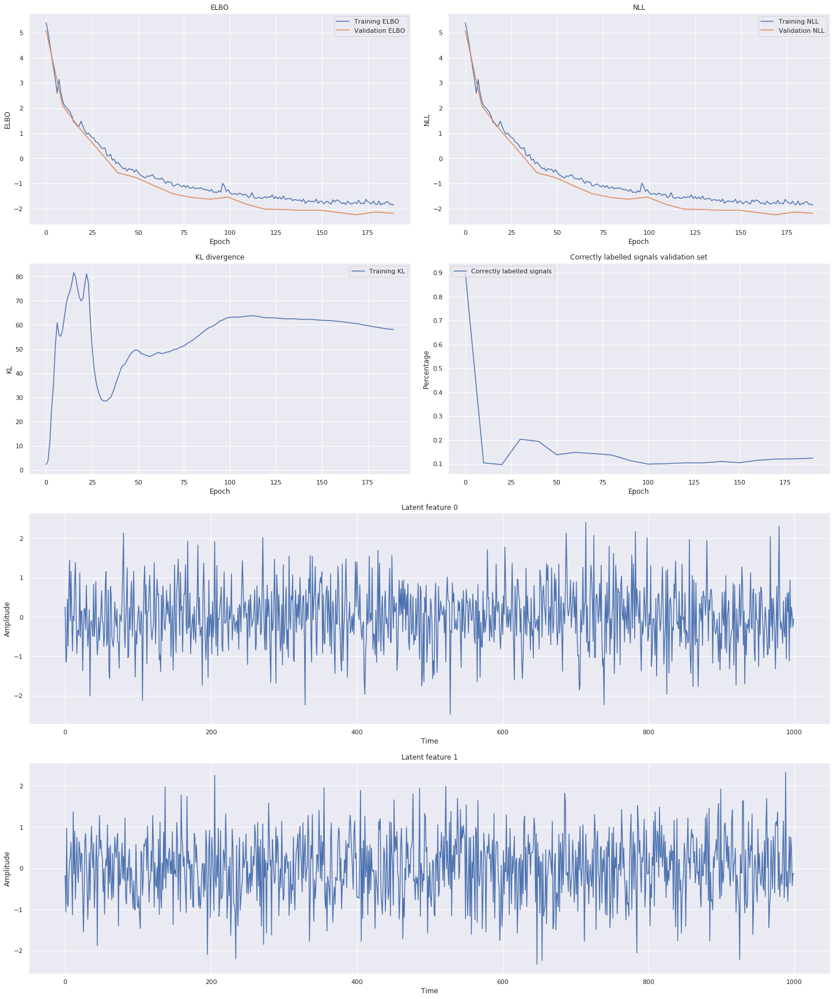

Epoch: 199


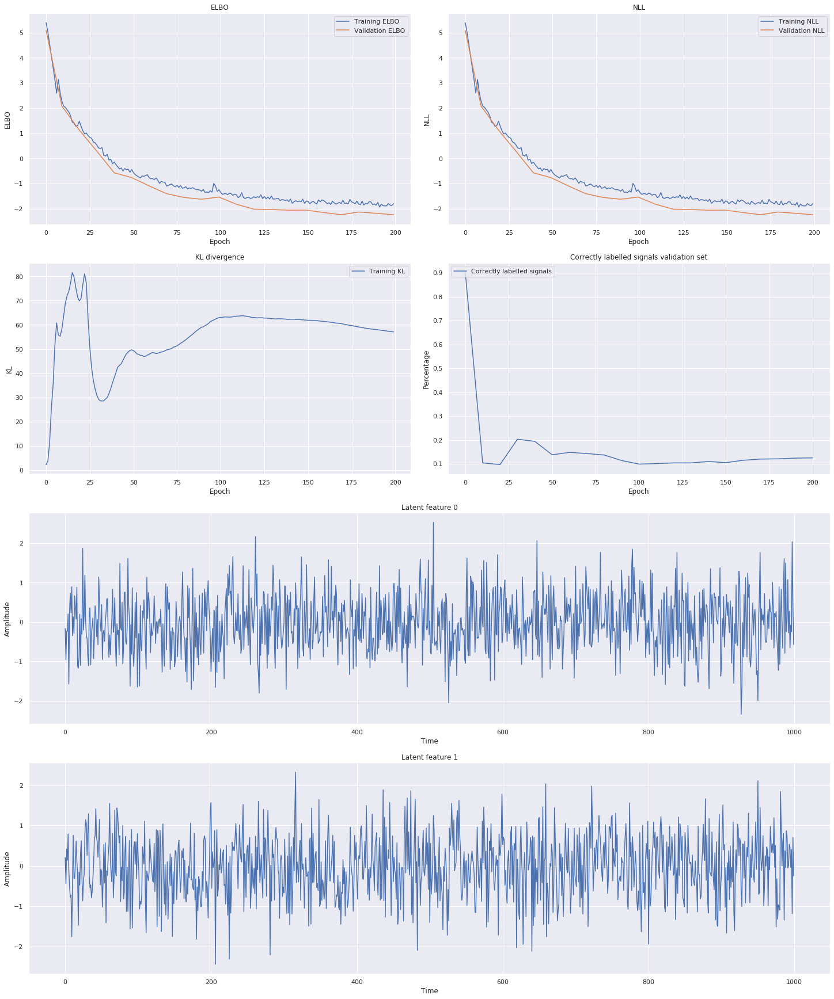

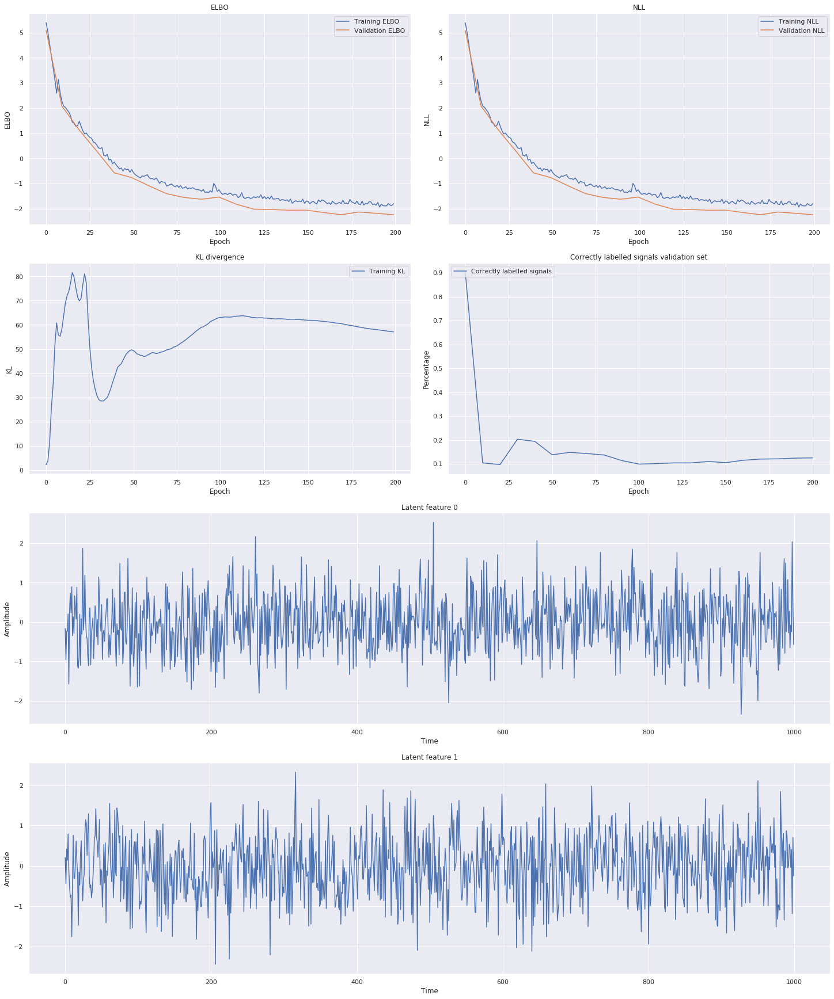

In [31]:
epochs_VAE = 200
params_distribution = 2
hidden_dim_gen = 100
hidden_dim_rec = 100
latent_dim = 2
torch.manual_seed(42)
np.random.seed(42)

#define the network
net = Variational_LSTM(features, params_distribution, hidden_dim_rec, hidden_dim_gen, latent_dim)
for param in net.parameters():
    param.data.uniform_(-0.1, 0.1)
#push it to the correct device
net.to(device)
#define the loss function
loss_function = loss_normal2d
#define the optimizer with the learning rate
optimizer = optim.Adam(net.parameters(), lr=0.01, weight_decay = 5*1e-3)
#here we define the scheduler
scheduler = StepLR(optimizer, step_size=50, gamma=0.5)

# beta annealing to try to address the vanishing KL
def constant_schedule(beta, epoch):
    return 0
def monotonic_sigmoid_schedule(beta, epoch):
    k = 1.4 # steepness
    m = 40 # half time
    return (k**(epoch-m))/((k**(epoch-m))+1)
def monotonic_linear_schedule(beta, epoch):
    start_epoch = 0
    len_annealing = 100
    if epoch < start_epoch:
        return 0
    elif epoch < start_epoch + len_annealing:
        return min(beta + 1./len_annealing,1.)
    else:
        return 1
def monotonic_weighted_linear_schedule(beta, epoch):
    start_epoch = 50
    len_annealing = 50
    maximum_beta = 0.0001
    if epoch < start_epoch:
        return 0
    elif epoch < start_epoch + len_annealing:
        return min(beta + maximum_beta/len_annealing,maximum_beta)
    else:
        return maximum_beta
def cyclic_annealing_schedule(beta, epoch):
    M = 9
    L = epochs_VAE / M
    R = 0.9
    tau = (epoch % math.ceil(L))/L
    f_type = "sigmoid" #linear, sigmoid
    if tau <= R:
        return increasing_function(tau, f_type, R)
    else:
        return 1
def increasing_function(tau, f_type, R):
    if f_type == "linear":
        return tau/R
    elif f_type == "sigmoid":
        k = 1.04 # steepness
        m = R/2 # half time
        return (k**(1000*(tau-m)))/((k**(1000*((tau-m))))+1)

chosen_annealing = constant_schedule

betas = []
beta = 0
for epoch in range(epochs_VAE):
    betas.append(chosen_annealing(beta, epoch))
    beta = betas[-1]
plt.figure(figsize = (20,10))
plt.title("Annealing of the KL term")
plt.xlabel("Epoch")
plt.ylabel("beta")
plt.plot(list(range(len(betas))), betas)


#run the training
net_state_dict, train_fig = train_network(device, train_loader, valid_dataset, epochs_VAE, net, \
                                          loss_function, optimizer, chosen_annealing, scheduler = scheduler, \
                                          p_anomaly = 1e-5)
net_state_dict_VAE = net_state_dict
train_fig_VAE = train_fig